  <style>
    .container {
      display: flex;
      justify-content: space-between;
      align-items: center;
    }

    .text {
      width: 95%;
       text-align: center;
    }

    .image {
      width: 5%;
      text-align: center; 
    }

    
    .image img {
      max-width: 100%;
      height: auto;
    }
  </style> 
  
  <div class="container">
    <div class="image">
      <img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/3a/Logo_KIT.svg/1200px-Logo_KIT.svg.png" width=100 height=50/>
    </div>
        <div class="text">
      <h1> Medical Image Processing and Navigation 2024/25</h1>
    </div>
  </div>

---

<center>
<h2>Python basics in medical images</h2> 
<img src="https://media.licdn.com/dms/image/D5612AQF2rxt03lwzfA/article-cover_image-shrink_720_1280/0/1687943342868?e=2147483647&v=beta&t=6LHuw7K4S4DmDMoormjw5SrqrlD2Turi1TRdvk52zgM" width=400 height=200/>


---

<center>
Lecturer: <b><i>Ciro Benito Raggio</i></b> 
<br/>
<a><href>https://www.ibt.kit.edu/english/Raggio_C.php</href></a>

# Read and plot 3D images with Python
What will we use? 
- **SimpleITK** is an image analysis toolkit with a large number of components supporting general filtering operations, image segmentation and registration.
- **Matplotlib** is a comprehensive library for creating static, animated, and interactive visualizations in Python.
- **Numpy** is a Python library used for working with arrays. It also has functions for working in domain of linear algebra, fourier transform, and matrices.
- **Open-CV** is the largest Computer Vision library in the world. It's used worldwide: in the world's biggest companies, underwater, and in space.
- **PyTorch** is a Python package that provides two high-level features: 
    - Tensor computation (like NumPy) with strong GPU acceleration
    - Deep neural networks dedicated methods and utilities

Important things in SimpleITK:

Internal axis are (X,Y,Z). It means, when we get numpy array dimensions are (Z,Y,X) i.e. shifted.
When we define orientation, orientation string is according to internal axis.
The orientation string is set with the latest letter, e.g. :

- **"RPS"** (left-to-Right or Sagittal, anterior-to-Posterior or Coronal, inferior-to-Superior or Axial)

- **"PSR"** (inferior-to-Superior or Axial, anterior-to-Posterior or Coronal, left-to-Right or Sagittal)

Quick review:

<table style="width: 100%; border-collapse: collapse; border-style: hidden;" border="0">
    <tbody>
        <tr>
            <td style="width: 100%;">
                <img style="display: block; margin-left: auto; margin-right: auto;" src="./assets/PythonBasicsLecture/SAC.gif" />
                    <p style="text-align: center;"><span style="color: #00ff00;">Axial plane</span></p>
                <p style="text-align: center;"><span style="color: #ff0000;">Sagittal plane</span></p>
                <p style="text-align: center;"><span style="color: #333399;">Coronal plane</span></p>
            </td>
        </tr>
    </tbody>
</table>

[Full video](https://www.youtube.com/watch?v=2J8bDkALBic&ab_channel=3D4MedicalFromElsevier)

---

In [23]:
import SimpleITK as sitk
import matplotlib.pyplot as plt
import numpy as np
import torch 
import cv2

ct_path='assets/PythonBasicsLecture/data/img0001.nii.gz'
ct_label_path='assets/PythonBasicsLecture/data/label0001.nii.gz'

# CT
ct_sitk  = sitk.ReadImage(ct_path, sitk.sitkFloat32) # Reading CT
ct_array = sitk.GetArrayFromImage(ct_sitk) # Converting sitk_metadata to image array

# Label
label_sitk = sitk.ReadImage(ct_label_path,sitk.sitkInt32) # Reading label
label_array = sitk.GetArrayFromImage(label_sitk) 

print(f'Original CT shape {ct_array.shape}, Original CT Label shape {label_array.shape}')

Original CT shape (147, 512, 512), Original CT Label shape (147, 512, 512)


### The volume has 148 (0-147) slices measuring 512x512px.

## Let's visualize the images

<h5>We can consider the 3D volume as a series of 2D images in succession.
We also extracted an array, so we can use indexing to retrieve a very specific slice, for example:</h5>

```python
image_array[0, :, :] # the first slice of the volume on the first view
image_array[:, :, -1] # the last slice of the volume on the last view
```

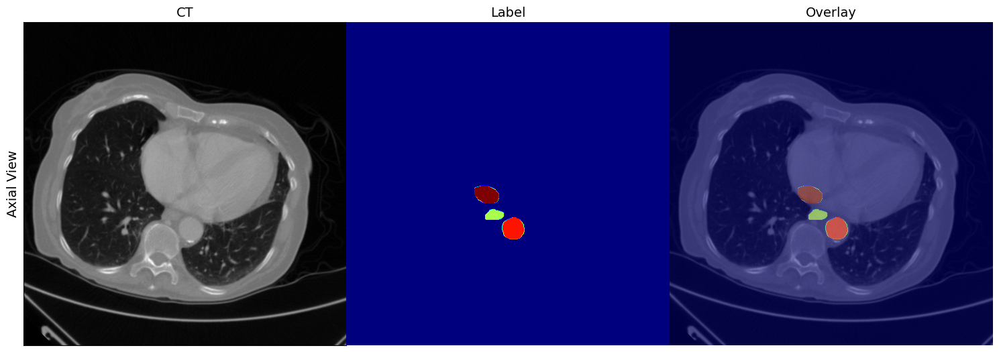

In [24]:
slice_number = -1

ct_slice = np.squeeze(ct_array[slice_number, :, :])

f, axarr = plt.subplots(1,3,figsize=(15,15))
axarr[0].imshow(ct_slice, cmap='gray',origin='lower')
axarr[0].set_ylabel('Axial View',fontsize=14)
axarr[0].set_xticks([])
axarr[0].set_yticks([])
axarr[0].set_title('CT',fontsize=14)

axarr[1].imshow(np.squeeze(label_array[slice_number, :, :]), cmap='jet',origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Label',fontsize=14)

axarr[2].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',alpha=1,origin='lower')
axarr[2].imshow(np.squeeze(label_array[slice_number, :, :]),cmap='jet',alpha=0.5,origin='lower')
axarr[2].axis('off')
axarr[2].set_title('Overlay',fontsize=14)
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

We can also visualize the values that are present in the CT in a very simple way using the colorbar method.

### Using slicing method to display other views.

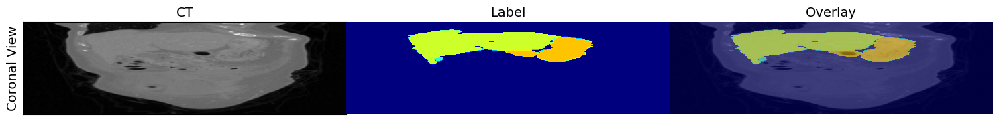

In [25]:
slice_number = -160
ct_slice = np.squeeze(ct_array[:, slice_number, :])

f, axarr = plt.subplots(1,3,figsize=(15,15))
axarr[0].imshow(ct_slice, cmap='gray',origin='lower')
axarr[0].set_ylabel('Coronal View',fontsize=14)
axarr[0].set_xticks([])
axarr[0].set_yticks([])
axarr[0].set_title('CT',fontsize=14)

axarr[1].imshow(np.squeeze(label_array[:, slice_number, :]), cmap='jet',origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Label',fontsize=14)

axarr[2].imshow(ct_slice, cmap='gray',alpha=1,origin='lower')
axarr[2].imshow(np.squeeze(label_array[:, slice_number, :]),cmap='jet',alpha=0.5,origin='lower')
axarr[2].axis('off')
axarr[2].set_title('Overlay',fontsize=14)
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

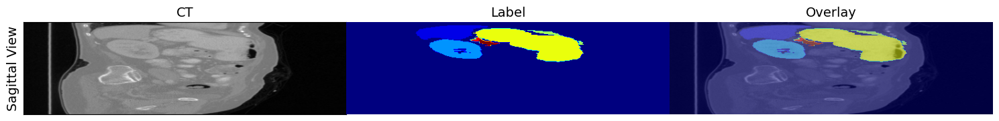

In [26]:
ct_slice = np.squeeze(ct_array[:, :, slice_number])

f, axarr = plt.subplots(1,3,figsize=(15,15))
axarr[0].imshow(ct_slice, cmap='gray',origin='lower')
axarr[0].set_ylabel('Sagittal View',fontsize=14)
axarr[0].set_xticks([])
axarr[0].set_yticks([])
axarr[0].set_title('CT',fontsize=14)

axarr[1].imshow(np.squeeze(label_array[:, :, slice_number]), cmap='jet',origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Label',fontsize=14)

axarr[2].imshow(ct_slice, cmap='gray',alpha=1,origin='lower')
axarr[2].imshow(np.squeeze(label_array[:, :, slice_number]),cmap='jet',alpha=0.5,origin='lower')
axarr[2].axis('off')
axarr[2].set_title('Overlay',fontsize=14)
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

### Inspect a volume with SimpleITK

In [27]:
print("Size:", ct_sitk.GetSize())  
print(f"Voxel spacing: {ct_sitk.GetSpacing()} [mm]" )  
print("Origin:", ct_sitk.GetOrigin())  
print("Cosines direction:", ct_sitk.GetDirection())  

pixel_type = ct_sitk.GetPixelIDTypeAsString()  
print("Pixel type:", pixel_type)
print("Voxel min value:", sitk.GetArrayFromImage(ct_sitk).min())  
print("Voxel max value:", sitk.GetArrayFromImage(ct_sitk).max())  

num_voxel = ct_sitk.GetWidth() * ct_sitk.GetHeight() * ct_sitk.GetDepth()
print("Voxels total:", num_voxel)

Size: (512, 512, 147)
Voxel spacing: (0.66796875, 0.66796875, 3.0) [mm]
Origin: (0.0, 0.0, 0.0)
Cosines direction: (1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0)
Pixel type: 32-bit float
Voxel min value: -1024.0
Voxel max value: 2639.0
Voxels total: 38535168


### Write a new volume with Simple ITK

In [28]:
sitk.WriteImage(ct_sitk, "./ct.nrrd")

# Metrics

## Mean Absolute Error (MAE)

Let's imagine that the real value is the value of the pixel, while the predicted one is the prediction of a neural network that tries to construct the image. How do we average the error between the pixels of the two corresponding images? One way can be MAE. Let's look at an example:

<table style="border-collapse: collapse; width: 100%; height: 72px;" border="1">
<tbody>
<tr style="height: 18px;">
<td style="width: 25%; height: 18px; text-align: center;">Real value</td>
<td style="width: 25%; height: 18px; text-align: center;">Prediction</td>
<td style="width: 25%; height: 18px; text-align: center;">Error</td>
<td style="width: 25%; height: 18px; text-align: center;">Absolute error</td>
</tr>
<tr style="height: 18px;">
<td style="width: 25%; height: 18px; text-align: center;">1</td>
<td style="width: 25%; height: 18px; text-align: center;">0.8</td>
<td style="width: 25%; height: 18px; text-align: center;">-0.2</td>
<td style="width: 25%; height: 18px; text-align: center;">0.2</td>
</tr>
<tr style="height: 18px;">
<td style="width: 25%; height: 18px; text-align: center;">1</td>
<td style="width: 25%; height: 18px; text-align: center;">1.5</td>
<td style="width: 25%; height: 18px; text-align: center;">0.5</td>
<td style="width: 25%; height: 18px; text-align: center;">0.5</td>
</tr>
<tr style="height: 18px;">
<td style="width: 25%; height: 18px; text-align: center;">0</td>
<td style="width: 25%; height: 18px; text-align: center;">-0.8</td>
<td style="width: 25%; height: 18px; text-align: center;">-0.8</td>
<td style="width: 25%; height: 18px; text-align: center;">0.8</td>
</tr>
</tbody>
</table>



$$
MAE = \frac{0.2 + 0.5 + 0.8}{3} = 0.5
$$

Let's add the blur to the CT slice pretending it is our output and see how to calculate the MAE with PyTorch!

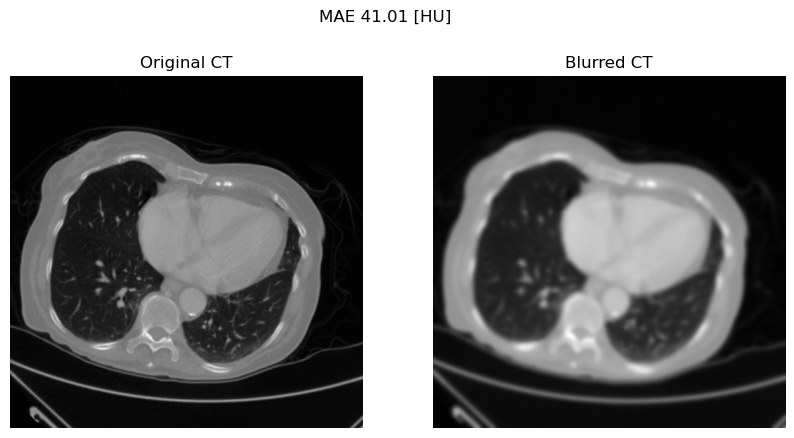

In [29]:
slice_number = -1
gaussian = sitk.SmoothingRecursiveGaussianImageFilter()
gaussian.SetSigma(float(2))
blur_ct = gaussian.Execute(ct_sitk)
blur_ct_array = sitk.GetArrayFromImage(blur_ct)

f, axarr = plt.subplots(1, 2, figsize=(10,5))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title('Original CT')

img = axarr[1].imshow(np.squeeze(blur_ct_array[slice_number, :, :]), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Blurred CT')

apply_mae = torch.nn.L1Loss()
mae = apply_mae(torch.tensor(ct_array[slice_number,:,:]), torch.tensor(blur_ct_array[slice_number,:,:])).item()
f.suptitle(f"MAE {np.round(mae, 2)} [HU]")
print()

## Structural Similarity Index Measure (SSIM)
SSIM measures the perceptual difference between two similar images. It cannot judge which of the two is better: that must be inferred from knowing which is the “original” and which has been subjected to additional processing such as data compression. Unlike PSNR (Peak Signal-to-Noise Ratio), SSIM is based on visible structures in the image. Although PSNR is only conclusively valid when it is used to compare results from the same codec (or codec type) and same content.


The resultant SSIM index is a decimal value between -1 and 1, where 1 indicates perfect similarity, 0 indicates no similarity, and -1 indicates perfect anti-correlation.

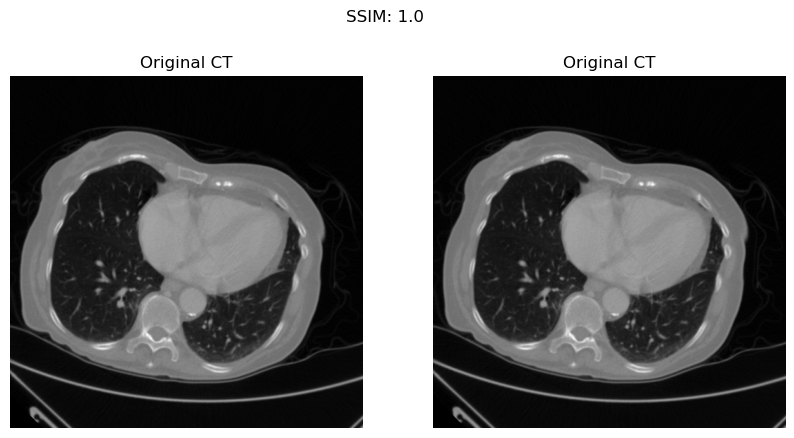

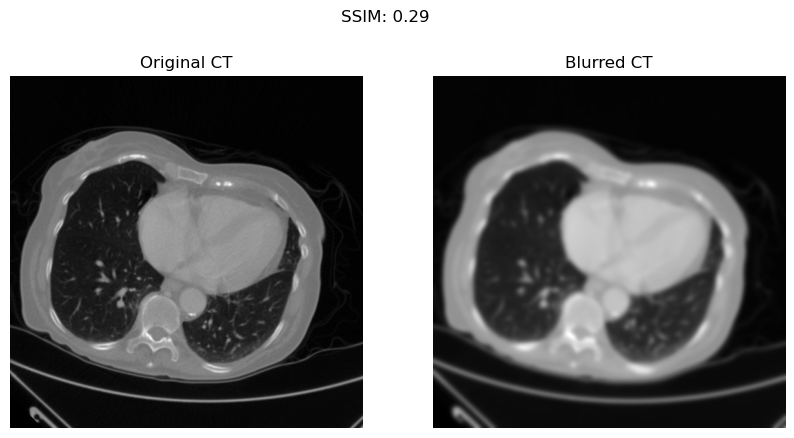

In [30]:
import pytorch_ssim
# To compute the ssim we need to bring our slices to the size 1,1,512,512
ct = torch.tensor(ct_array[slice_number,:,:]).unsqueeze(0).unsqueeze(0)
blur_ct = torch.tensor(blur_ct_array[slice_number,:,:]).unsqueeze(0).unsqueeze(0)

ct_ct_ssim = pytorch_ssim.ssim(ct,ct).item()
ct_blur_ct_ssim = pytorch_ssim.ssim(ct,blur_ct).item()

f, axarr = plt.subplots(1, 2, figsize=(10,5))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title('Original CT')

img = axarr[1].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Original CT')
f.suptitle(f"SSIM: {ct_ct_ssim}")

f, axarr = plt.subplots(1, 2, figsize=(10,5))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title('Original CT')

img = axarr[1].imshow(np.squeeze(blur_ct_array[slice_number, :, :]), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title('Blurred CT')
f.suptitle(f"SSIM: {np.round(ct_blur_ct_ssim, 2)}")
print()


# DRR
A Digitally Reconstructed Radiograph (DRR) is a simulation of a conventional 2D x-ray image, created from computed tomography (CT) data. 

To obtain it we can simply calculate the average of the slices by squashing everything onto a two-dimensional plane.

(512, 512, 138)
(512, 512)


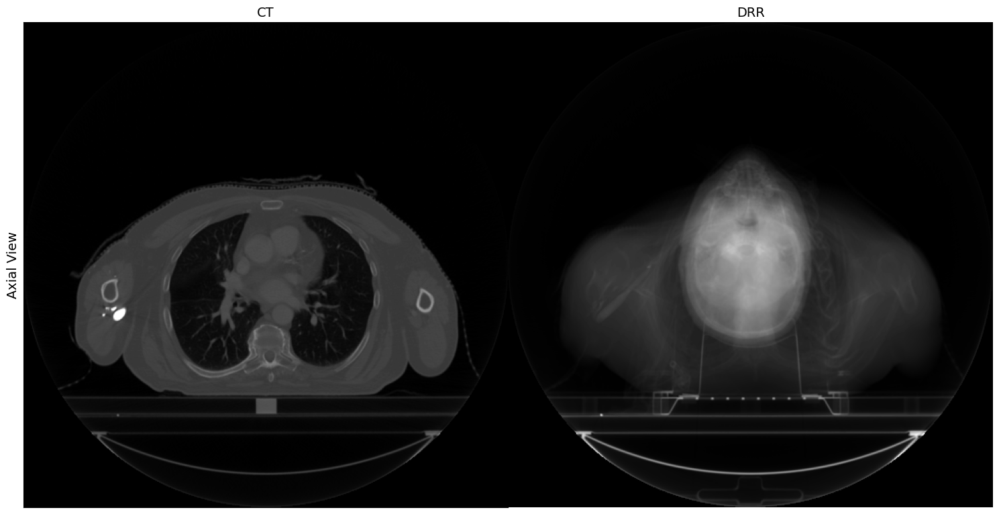

In [31]:
ct_drr_sitk  = sitk.ReadImage("./assets/PythonBasicsLecture/data/CTDRR.nrrd", sitk.sitkFloat32) # Reading CT
ct_drr_sitk = sitk.PermuteAxes(ct_drr_sitk, [0, 1, 2])
ct_drr_sitk = sitk.Flip(ct_drr_sitk, [False, True, True])  # Rotate on [Y, Z]

ct_drr_array = sitk.GetArrayFromImage(ct_drr_sitk)

print(ct_drr_sitk.GetSize())

drr_axial = np.mean(ct_drr_array, axis=0)

print(drr_axial.shape)

f, axarr = plt.subplots(1,2,figsize=(15,15))
axarr[0].imshow(np.squeeze(ct_drr_array[135,:,:]), cmap='gray',origin='lower')
axarr[0].set_ylabel('Axial View',fontsize=14)
axarr[0].set_xticks([])
axarr[0].set_yticks([])
axarr[0].set_title('CT',fontsize=14)

axarr[1].imshow(drr_axial, cmap='gray',origin='lower')
axarr[1].axis('off')
axarr[1].set_title('DRR',fontsize=14)

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

# Maximum Intensity Projection
A maximum intensity projection (MIP) is a method for 3D data that projects in the visualization plane the voxels with maximum intensity that fall in the way of parallel rays traced from the viewpoint to the plane of projection. 

This implies that two MIP renderings from opposite viewpoints are symmetrical images if they are rendered using orthographic projection.

Example:
<center><img src="https://lh3.googleusercontent.com/proxy/ihrwf_9nhSOtMGoYm8XHeHvF65dTSpBo2wIg7NqlN3rOnU0tnNiioG9uMlvOAcm1YeUji_wWriCDglzrQnKNY_DYH9W4_uMoYsqguuqLu7s9eA">

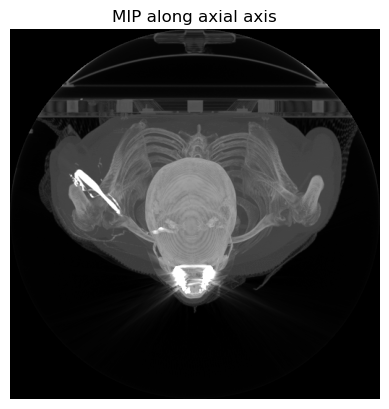

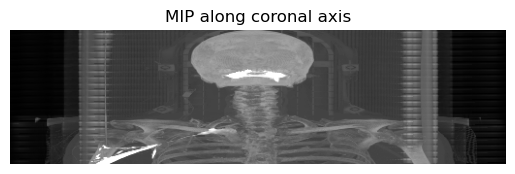

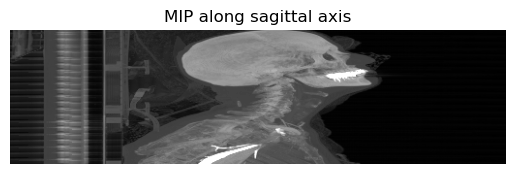

In [32]:
views = {0:"axial", 1:"coronal", 2:"sagittal"}
results = {"axial": [], "coronal": [], "sagittal": []}

for axis, view in views.items():
    # Calculate the MIP along an axis
    mip = np.max(ct_drr_array, axis=axis)
    results[view] = mip # store the result for each view


for view, result in results.items():
    plt.imshow(result, cmap='gray')
    plt.title(f"MIP along {view} axis")
    plt.axis('off') 
    plt.show()

# Histogram processing

Let's display the CT histogram

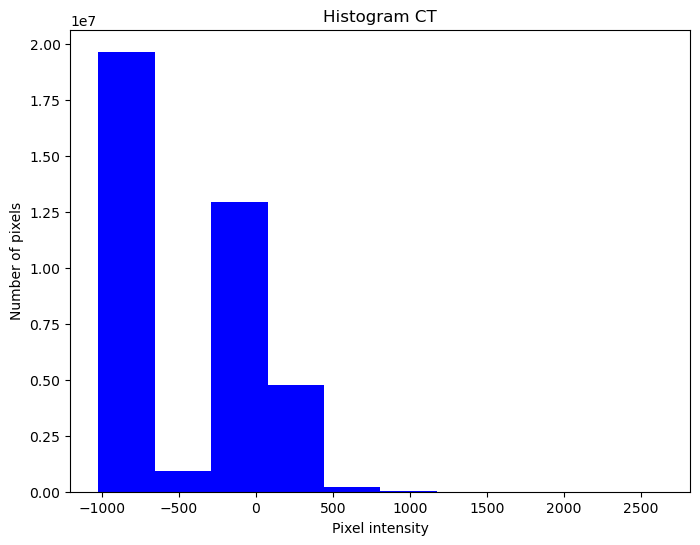

In [33]:
plt.figure(figsize=(8, 6))
plt.hist(ct_array.ravel(), color='blue')
plt.title('Histogram CT')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.show()

## Histogram equalization
Histogram equalization serves to improve the contrast of an image by distributing intensity values ​​more evenly.

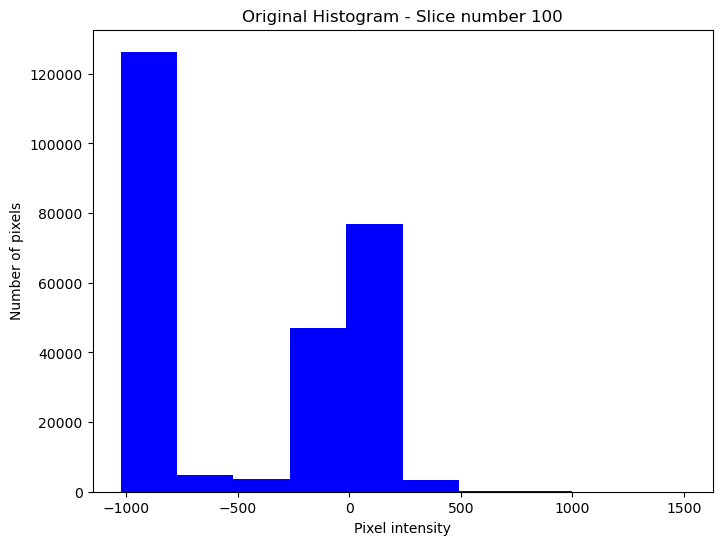

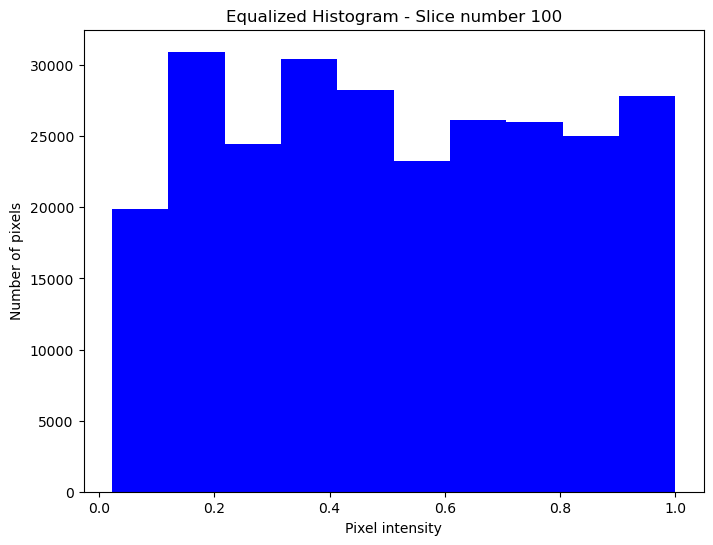

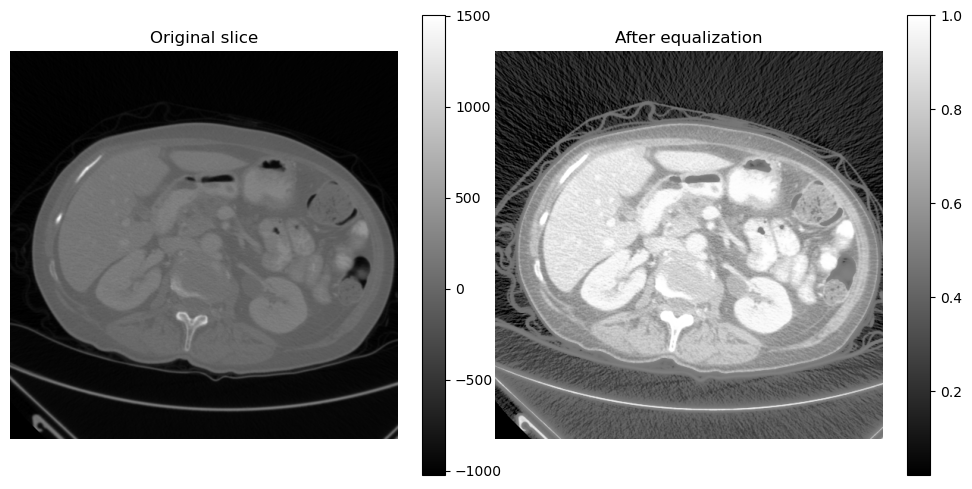

In [34]:
import skimage.exposure as exposure 

slice_number = 100

equalized_image = exposure.equalize_hist(ct_array[slice_number,:,:])

plt.figure(figsize=(8, 6))
plt.hist(ct_array[slice_number,:,:].ravel(), color='blue')
plt.title(f'Original Histogram - Slice number {slice_number}')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(equalized_image.ravel(), color='blue')
plt.title(f'Equalized Histogram - Slice number {slice_number}')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.show()

f, axarr = plt.subplots(1, 2, figsize=(10,5))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title('Original slice')
f.colorbar(img, ax=axarr[0])

img = axarr[1].imshow(np.squeeze(equalized_image), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title('After equalization')
f.colorbar(img, ax=axarr[1])
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)


## Histogram stretching
Histogram stretching involves modifying the brightness (intensity) values of pixels in the image according to some mapping function that specifies an output pixel brightness value for each input pixel brightness value. 

0.0 1.0


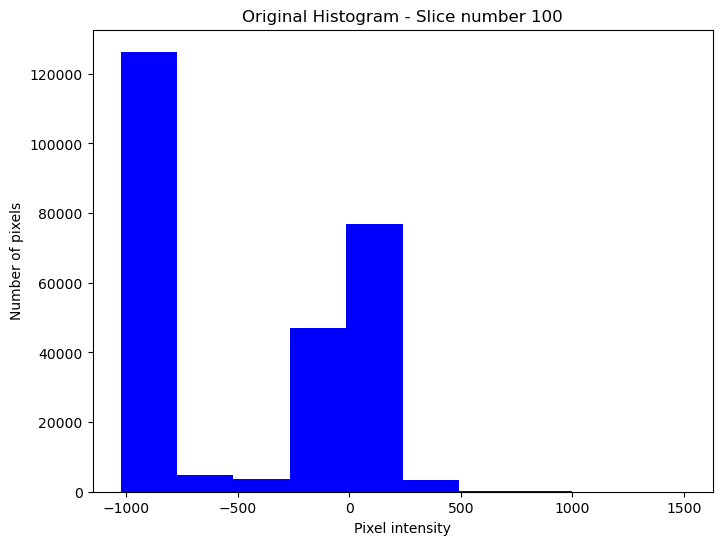

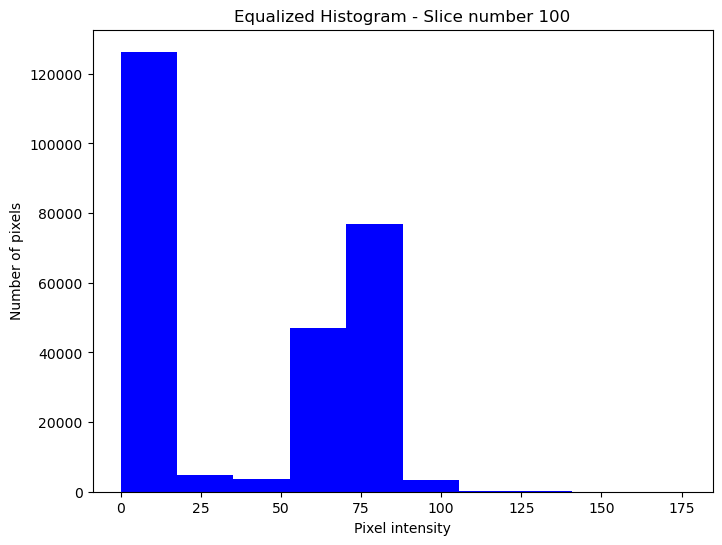

Min value: 0.0 - Max value: 255.0


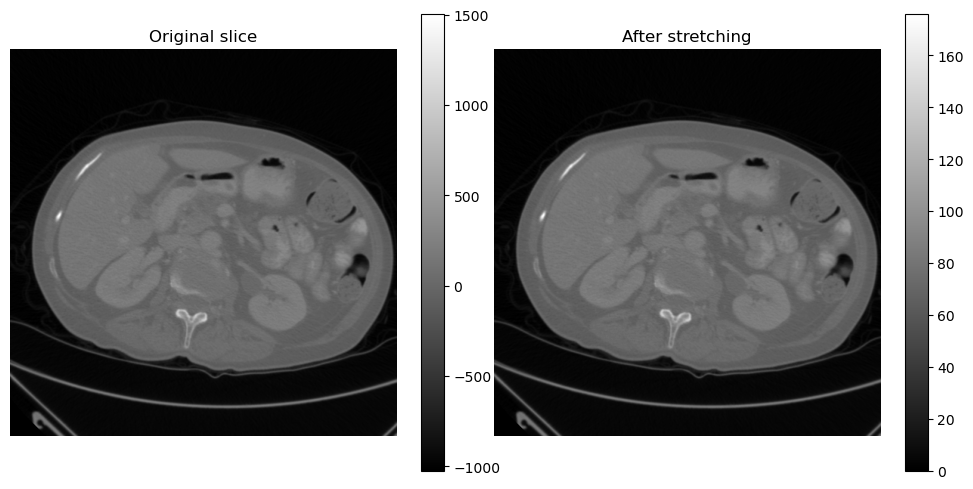

In [35]:
norm_image = (ct_array - ct_array.min()) / (ct_array.max() - ct_array.min()) # Values between 0 and 1
print(norm_image.min(), norm_image.max())

stretched_image = (norm_image - norm_image.min()) * 255 / (norm_image.max() - norm_image.min())

plt.figure(figsize=(8, 6))
plt.hist(ct_array[slice_number,:,:].ravel(), color='blue')
plt.title(f'Original Histogram - Slice number {slice_number}')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.show()

plt.figure(figsize=(8, 6))
plt.hist(stretched_image[slice_number,:,:].ravel(), color='blue')
plt.title(f'Equalized Histogram - Slice number {slice_number}')
plt.xlabel('Pixel intensity')
plt.ylabel('Number of pixels')
plt.show()

f, axarr = plt.subplots(1, 2, figsize=(10,5))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title('Original slice')
f.colorbar(img, ax=axarr[0])

img = axarr[1].imshow(np.squeeze(stretched_image[slice_number, :, :]), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title('After stretching')
f.colorbar(img, ax=axarr[1])
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

print(f"Min value: {stretched_image.min()} - Max value: {stretched_image.max()}")

## Gamma correction
Gamma correction aims to bridge the gap between the linear response of the image data and the nonlinear response of the eye and screen.
A mathematical curve, called a gamma curve, is applied to change the intensity values ​​of the image.
By increasing the gamma value, the image becomes darker; decreasing it, it becomes clearer.

<center><img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQeUOEOI8Msx58Hg61Wd4AefrKAWO_gB7bJNA&s"></center>

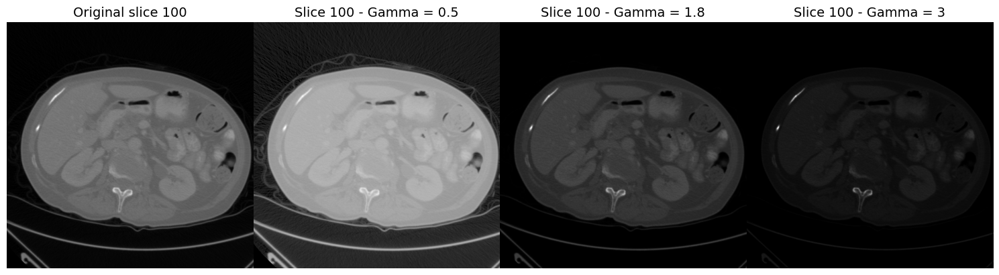

In [36]:
def gamma_correction(image_np, gamma):
    return ((image_np / image_np.max()) ** gamma) * image_np.max()

gamma_1 = 0.5
gamma_2 = 1.8
gamma_3 = 3
gamma_corrected_1 = gamma_correction(stretched_image[slice_number, :, :], gamma_1)
gamma_corrected_2 = gamma_correction(stretched_image[slice_number, :, :], gamma_2)
gamma_corrected_3 = gamma_correction(stretched_image[slice_number, :, :], gamma_3)

f, axarr = plt.subplots(1, 4, figsize=(15,15))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title(f'Original slice {slice_number}',fontsize=14)

img = axarr[1].imshow(np.squeeze(gamma_corrected_1), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title(f'Slice {slice_number} - Gamma = {gamma_1}',fontsize=14)

img = axarr[2].imshow(np.squeeze(gamma_corrected_2), cmap='gray', origin='lower')
axarr[2].axis('off')
axarr[2].set_title(f'Slice {slice_number} - Gamma = {gamma_2}',fontsize=14)

img = axarr[3].imshow(np.squeeze(gamma_corrected_3), cmap='gray', origin='lower')
axarr[3].axis('off')
axarr[3].set_title(f'Slice {slice_number} - Gamma = {gamma_3}',fontsize=14)

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

# Convolution
What is a convolution? A 2D Convolution operation is a widely used operation in computer vision and deep learning. It is a mathematical operation that applies a filter to an image, producing a filtered output (also called a feature map).

<center>
<video autoplay loop playsinline controls muted>
  <source  src="https://bioimagebook.github.io/_static/videos/filter_3x3.mp4" type="video/mp4">
</video>
</center>

Convolutions are a fundamental concept in computer vision and image processing. They are mathematical operations that take an input signal (such as an image) and produce a transformed output signal that highlights certain features of the input.

## Mean filter
 
The simplest linear filter is the **mean filter**. Each pixel value is simply replaced by the average (mean) of itself and its neighbors within a defined area. The filter kernel contains 9 values, arranged as a 3×3 square. Each coefficient is 1/9, meaning that together all coefficients sum to 1.

One of the main uses of a 3×3 mean filter is to reduce some common types of image noise, including Gaussian noise and Poisson noise so we will add noise to a slice of the CT to understand the effect.

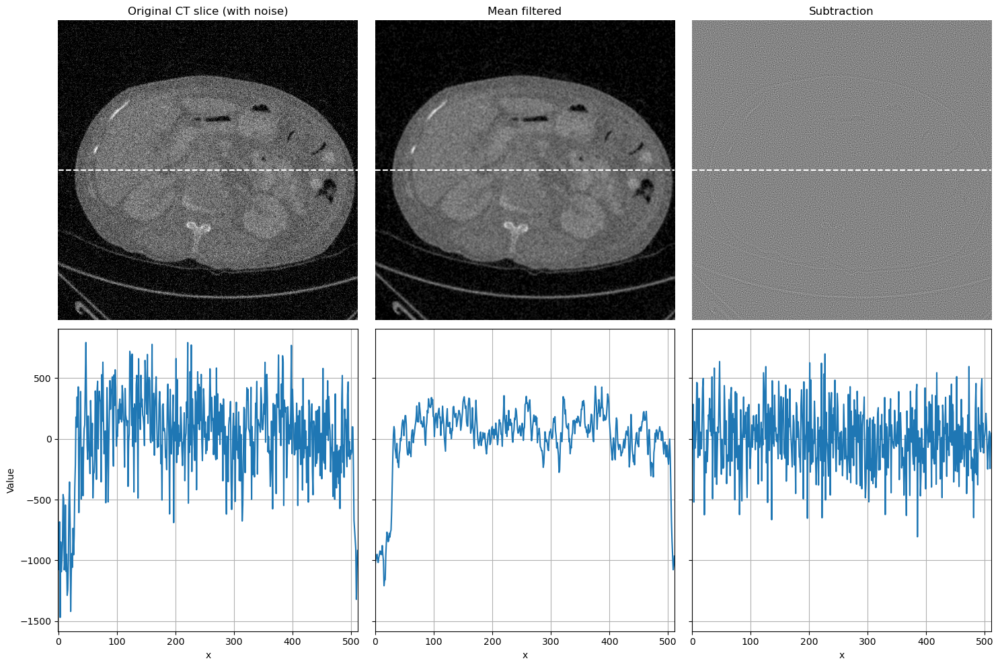

In [38]:
import matplotlib.pyplot as plt
from scipy import ndimage
import numpy as np

def show_plot(data, xlabel='', ylabel='', pos=None):
    ax = plt.subplot(pos)
    ax.plot(data)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.grid()

ct_slice = ct_array[100, :, :]

# Apply noise
rng = np.random.default_rng(100)
ct_slice_noise = ct_slice + rng.normal(size=ct_slice.shape) * 300

kernel = np.ones((3, 3))
kernel /= kernel.sum()

ct_slice_mean = ndimage.convolve(ct_slice_noise, kernel)
ct_slice_diff = ct_slice_noise - ct_slice_mean

# Center line
row = ct_slice.shape[0] // 2
line_args = ([0, ct_slice.shape[1] - 1], [row, row], 'w--')

f, axarr = plt.subplots(2, 3, sharex='col', sharey='row', figsize=(15, 10))
vmin, vmax = ct_slice.min(), ct_slice.max()

img = axarr[0, 0].imshow(ct_slice_noise, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
axarr[0, 0].axis('off')
axarr[0, 0].set_title('Original CT slice (with noise)')
axarr[0, 0].plot(*line_args)


img = axarr[0, 1].imshow(ct_slice_mean, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
axarr[0, 1].axis('off')
axarr[0, 1].set_title('Mean filtered')
axarr[0, 1].plot(*line_args)


img = axarr[0, 2].imshow(ct_slice_diff, cmap='gray', origin='lower')
axarr[0, 2].axis('off')
axarr[0, 2].set_title('Subtraction')
axarr[0, 2].plot(*line_args)

# Plotting values ​​along the center line
show_plot(ct_slice_noise[row, :], ylabel='Value', xlabel='x', pos=234)
show_plot(ct_slice_mean[row, :], xlabel='x', pos=235)
show_plot(ct_slice_diff[row, :], xlabel='x', pos=236)

plt.tight_layout()
plt.show()

One common change is to make a **‘circular’** mean filter. 

We can do this by defining the kernel in such a way that coefficients we want to ignore are set to 0, and the non-zero pixels approximate a circle. The size of the filter is then defined in terms of a radius value.

<center>
<img src="https://bioimagebook.github.io/_images/4221c4778748ef8471d92c33ffce9bd0a46d3a0d5a2610249427cc348c6ec9f3.png">
</center>

**Increasing the size of a mean filter increases its impact**. This is not only in terms of **reducing noise**, **but also** in terms of **reducing detail**, i.e. making the image more blurry

Original image (with noise) 
 None
Filtered, radius=1 
 [[0.  0.2 0. ]
 [0.2 0.2 0.2]
 [0.  0.2 0. ]]
Filtered, radius=5 
 [[0.         0.         0.         0.         0.         0.01234568
  0.         0.         0.         0.         0.        ]
 [0.         0.         0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.         0.        ]
 [0.         0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.01234568 0.        ]
 [0.         0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.01234568 0.        ]
 [0.         0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.01234568 0.        ]
 [0.01234568 0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.01234568 0.01234568]
 [0.         0.01234568 0.01234568 0.01234568 0.01234568 0.01234568
  0.01234568 0.01234568 0.01234568 0.01234568 0.     

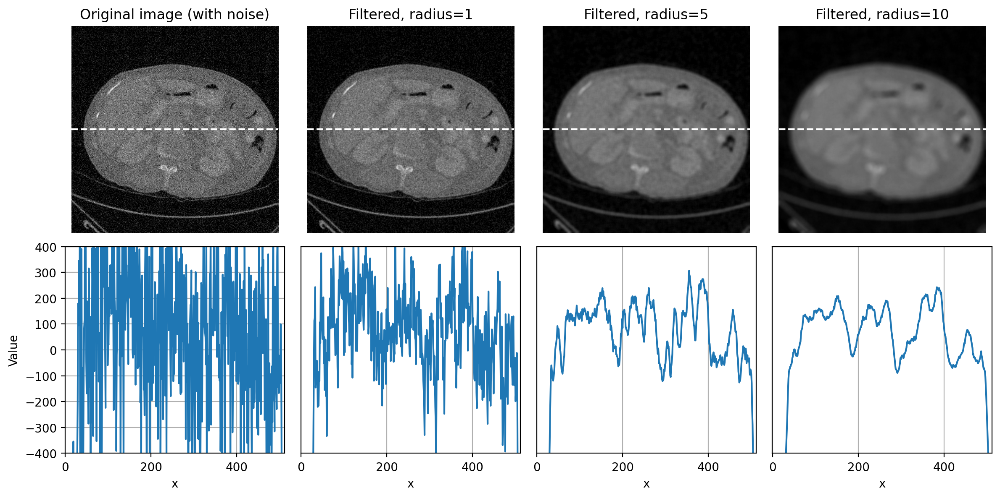

In [39]:
def create_mean_kernel(radius: int):
    x = np.arange(-radius, radius+1) # i.e. radius = 2 -> x and y = [-2, -1, 0, 1, 2]
    y = np.arange(-radius, radius+1)
    y, x = np.meshgrid(y, x)
    mask = x*x + y*y <= radius*radius # Boolean output -> True if the pixel is part of the circle
    kernel = mask.astype(np.float64) # Boolean to digits (0.0 or 1.0)
    return kernel / kernel.sum() # kernel normalization

#Function to show the image in the specific axis
def show_image(ax, data, title):
    ax.imshow(data, cmap='gray', origin='lower', vmin=ct_slice.min(), vmax=ct_slice.max())
    ax.axis('off')
    ax.set_title(title)

# Function to show centerline graph in specific axis
def show_plot(ax, data, xlabel='', ylabel=''):
    ax.plot(data)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.grid()
     
kernels = {
    'Original image (with noise)': None,
    'Filtered, radius=1': create_mean_kernel(1),
    'Filtered, radius=5': create_mean_kernel(5),
    'Filtered, radius=10': create_mean_kernel(10)
}

for kernel_key, kernel_values in kernels.items():
    print(f"{kernel_key} \n {kernel_values}")

row = ct_slice.shape[0] // 2
line_args = ([0, ct_slice.shape[1] - 1], [row, row], 'w--')

fig, axarr = plt.subplots(2, len(kernels), sharex='col', figsize=(12, 6), dpi=200)

for idx, (title, kernel) in enumerate(kernels.items()):
    ct_slice_filtered = ct_slice_noise if kernel is None else ndimage.convolve(ct_slice_noise, kernel)

    show_image(axarr[0, idx], ct_slice_filtered, title=title)
    axarr[0, idx].plot(*line_args)

    show_plot(axarr[1, idx], ct_slice_filtered[row, :], xlabel='x', ylabel='Value' if idx == 0 else '')

    axarr[1, idx].set_ylim([-400, 400])
    if idx > 0:
        axarr[1, idx].set_yticks([])

plt.tight_layout()
plt.show()

## Gradient filters

Linear filters can do much more than simply compute local averages. We only need to define a new filter kernel with different coefficients.

Often, we want to detect structures in an image that are distinguishable from the background because of their edges. Being able to detect the edges could therefore be useful. Because an edge is usually characterized by a relatively sharp transition in pixel values, **gradient filters** can help us.

A very simple gradient filter has the coefficients -1, 0, 1. Applied to an image, this replaces every pixel with the difference between the pixel to the right and the pixel to the left. 

The output is positive whenever the pixel values are increasing horizontally, negative when the pixel values are decreasing, and zero if the values are constant.


Horizontal kernel: [[-1  0  1]]
Vertical kernel:
[[-1]
 [ 0]
 [ 1]]


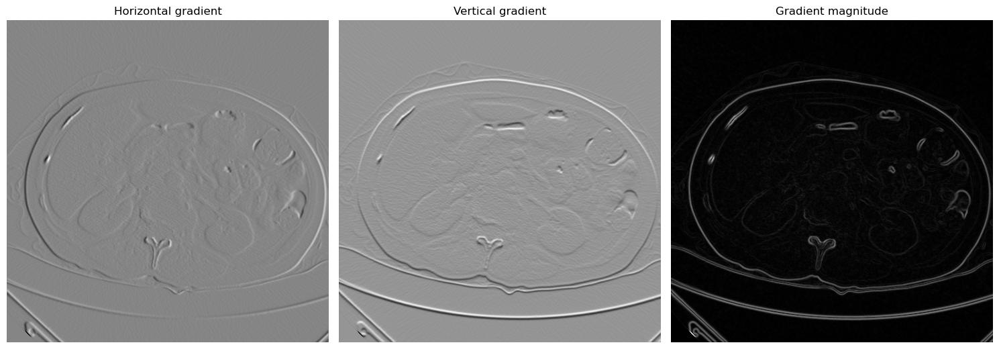

In [40]:
def show_image(data, title, pos, **kwargs):
    ax = plt.subplot(pos)
    im = ax.imshow(data, cmap='gray', origin='lower', **kwargs)
    ax.axis('off')
    ax.set_title(title)
    return im

ct_slice = ct_array[100, :, :]

fig = plt.figure(figsize=(15, 15))

gradient_filter = [-1, 0, 1]

kernel_horizontal = np.asarray(gradient_filter).reshape((1, 3))
kernel_vertical = np.asarray(gradient_filter).reshape((3, 1))

print(f"Horizontal kernel: {kernel_horizontal}")
print(f"Vertical kernel:\n{kernel_vertical}")

im_horizontal = ndimage.convolve(ct_slice, kernel_horizontal)
show_image(im_horizontal, title="Horizontal gradient", pos=131)

im_vertical = ndimage.convolve(ct_slice, kernel_vertical)
show_image(im_vertical, title="Vertical gradient", pos=132)

# Magnitude of the gradient
ct_slice_grad_mag = np.sqrt(im_horizontal**2 + im_vertical**2)
show_image(ct_slice_grad_mag, title="Gradient magnitude", pos=133)

plt.tight_layout()
plt.show()


## Gaussian filters

A Gaussian filter is a linear filter that also **smooths an image and reduces noise**. 

Unlike a mean filter – for which even the furthest away pixels in the neighborhood influence the result by the same amount as the closest pixels – the smoothing of a Gaussian filter is weighted so that the influence of a pixel decreases with its distance from the filter center.


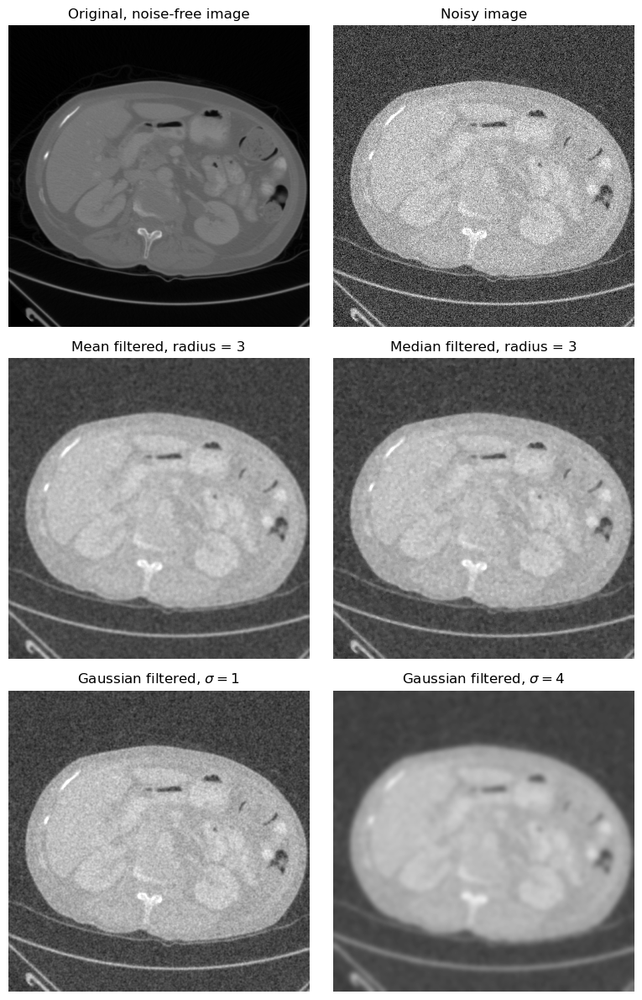

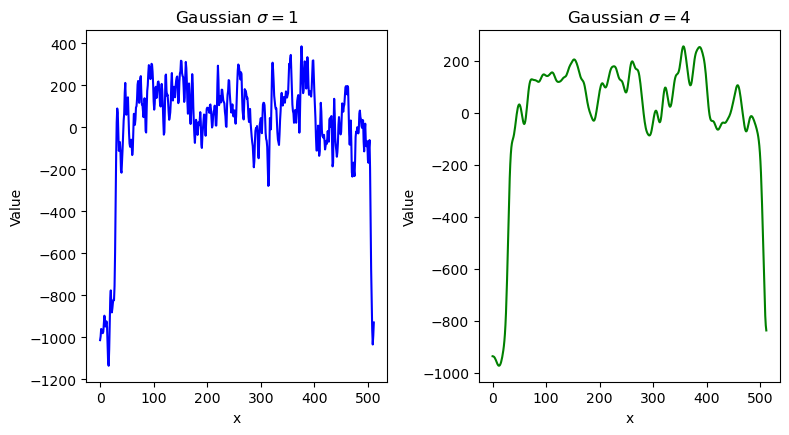

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def show_image(data, title, pos, **kwargs):
    ax = plt.subplot(pos)
    im = ax.imshow(data, cmap='gray', origin='lower', **kwargs)
    ax.axis('off')
    ax.set_title(title)
    return im

fig = plt.figure(figsize=(8, 12))

# Parameters for display (1% and 99% percentiles for scale)
show_args = dict(
    vmin=np.percentile(ct_slice_noise, 1),
    vmax=np.percentile(ct_slice_noise, 99)
)

show_image(ct_slice, title="Original, noise-free image", pos=321)
show_image(ct_slice_noise, title="Noisy image", pos=322, **show_args)

kernel = create_mean_kernel(3)
im_mean = ndimage.convolve(ct_slice_noise, kernel)
show_image(im_mean, title="Mean filtered, radius = 3", pos=323, **show_args)

im_median = ndimage.median_filter(ct_slice_noise, footprint=(kernel > 0))
show_image(im_median, title="Median filtered, radius = 3", pos=324, **show_args)

im_gauss_1 = ndimage.gaussian_filter(ct_slice_noise, 1)
show_image(im_gauss_1, title="Gaussian filtered, $\sigma = 1$", pos=325, **show_args)

im_gauss_4 = ndimage.gaussian_filter(ct_slice_noise, 4)
show_image(im_gauss_4, title="Gaussian filtered, $\sigma = 4$", pos=326, **show_args)

plt.tight_layout()
plt.show()

# Show intensity
fig_2 = plt.figure(figsize=(8, 12))

central_row = ct_slice_noise.shape[0] // 2
x_vals = np.arange(ct_slice_noise.shape[1])

ax1 = plt.subplot(325)
ax1.plot(x_vals, im_gauss_1[central_row, :], color='blue', label="Gaussian $\sigma=1$")
ax1.set_title("Gaussian $\sigma=1$")
ax1.set_xlabel("x")
ax1.set_ylabel("Value")

ax2 = plt.subplot(326)
ax2.plot(x_vals, im_gauss_4[central_row, :], color='green', label="Gaussian $\sigma=4$")
ax2.set_title("Gaussian $\sigma=4$")
ax2.set_xlabel("x")
ax2.set_ylabel("Value")

plt.tight_layout()
plt.show()


## Difference of Gaussians filtering

Suppose we apply one Gaussian filter to reduce small structures. Then we apply a second Gaussian filter, bigger than the first, to a duplicate of the original image. This will remove even more structures, while still preserving the largest features in the image.

If we subtract this second filtered image from the first, we are left with an image that contains the information that ‘falls between’ the two smoothing scales we used. 

This process is called **difference of Gaussians (DoG) filtering**.

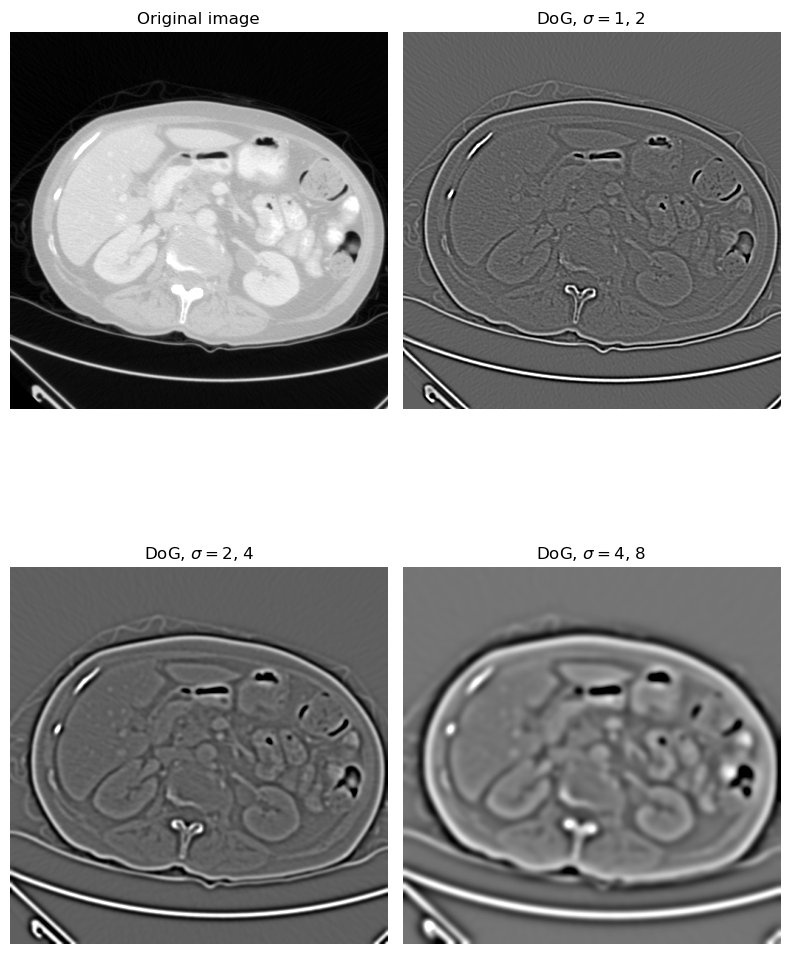

In [42]:
fig = plt.figure(figsize=(8, 12))

def show_image(data, title, pos, clip_percentile=0.5):
    ax = plt.subplot(pos)
    # Apply percentage clipping to smooth the scale
    vmin, vmax = np.percentile(data, [clip_percentile, 100 - clip_percentile])
    im = ax.imshow(data, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
    ax.axis('off')
    ax.set_title(title)
    return im

def dog_filter(im, sigma1, sigma2):
    """
    Apply a difference of Gaussians filter
    """
    im1 = ndimage.gaussian_filter(im.astype(np.float32), sigma1)
    im2 = ndimage.gaussian_filter(im.astype(np.float32), sigma2)
    return im1 - im2

ct_slice = ct_array[100,:,:]

show_image(ct_slice, title="Original image", clip_percentile=0.5, pos=221)
show_image(dog_filter(ct_slice, 1, 2), title="DoG, $\sigma = $1, 2", clip_percentile=0.5, pos=222) # 0.5% of the lowest and highest values ​​are excluded, setting the display range between 0.5% and 99.5% of the values
show_image(dog_filter(ct_slice, 2, 4), title="DoG, $\sigma = $2, 4", clip_percentile=0.5, pos=223)
show_image(dog_filter(ct_slice, 4, 8), title="DoG, $\sigma = $4, 8", clip_percentile=0.5, pos=224)

plt.tight_layout()
plt.show()

## Laplacian of Gaussian filtering

One minor complication with DoG filtering is the need to select two different values of $\sigma$. A similar operation, which requires **only a single** $\sigma$ and a single filter, is **Laplacian of Gaussian (LoG) filtering**.

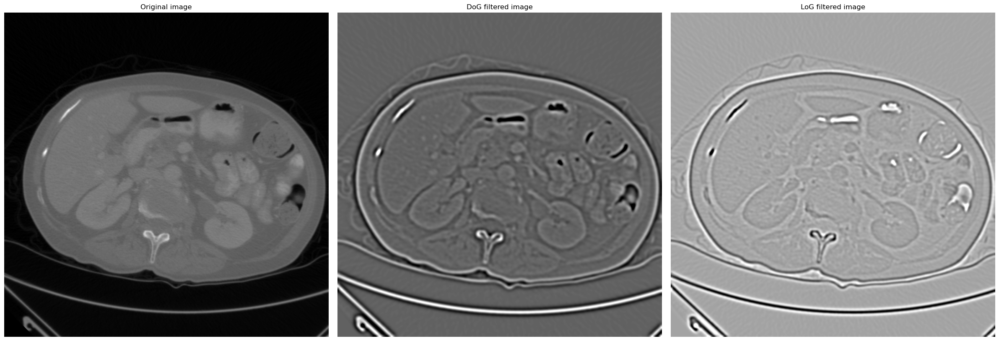

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import ndimage

def show_image(data, title, pos, clip_percentile=None):
    ax = plt.subplot(pos)
    if clip_percentile is not None:
        vmin, vmax = np.percentile(data, [clip_percentile, 100 - clip_percentile])
        im = ax.imshow(data, cmap='gray', origin='lower', vmin=vmin, vmax=vmax)
    else:
        im = ax.imshow(data, cmap='gray', origin='lower')
    ax.axis('off')
    ax.set_title(title)
    return im

sigma_dog = 2
sigma_log = 2
ct_slice = ct_array[100, :, :]

fig = plt.figure(figsize=(24,24))

show_image(ct_slice, title="Original image", pos=331)

ct_slice_dog = ndimage.gaussian_filter(ct_slice, sigma_dog) - ndimage.gaussian_filter(ct_slice, sigma_dog * 1.6)
show_image(ct_slice_dog, title="DoG filtered image", clip_percentile=0.25, pos=332)

ct_slice_log = ndimage.gaussian_laplace(ct_slice, sigma_log)
show_image(ct_slice_log, title="LoG filtered image", clip_percentile=0.25, pos=333)

plt.tight_layout()
plt.show()

 In the case of LoG filtering: darker points become bright after filtering.

# Image Pyramids
Sometimes we need to resize or sub-sample an image. In such cases, we maintain a collection of the same image at different resolutions, called an "image pyramid". The reason for calling it "pyramid" is that the collection can be arranged in decreasing order of resolution, resulting in a pyramid shape. In simple terms, an “image pyramid” is a multi-scale representation of an image.

There are two kinds of pyramids: 
- **Gaussian** Pyramid: used to downsample images
- **Laplacian** Pyramid: used to reconstruct an upsampled image from an image lower in the pyramid (with less resolution)

<center>
<table style="border:hidden">
<tr>
<td>
<center><img  height=385 width=700 src="https://www.researchgate.net/publication/283582925/figure/fig9/AS:668780862660630@1536461191957/The-structure-of-the-image-pyramid-and-the-illustration-of-image-resolutions-a-The.png"></center>
</td>
<td>
<center><img src="https://cvexplained.wordpress.com/wp-content/uploads/2020/07/image-1.png?w=482"></center>
</td>
</tr>
</table>
</center>

## Gaussian Pyramid
In Gaussian Pyramid, to downsample the image, we apply a Gaussian filter (blur the image) before sub-sampling the image for each level.

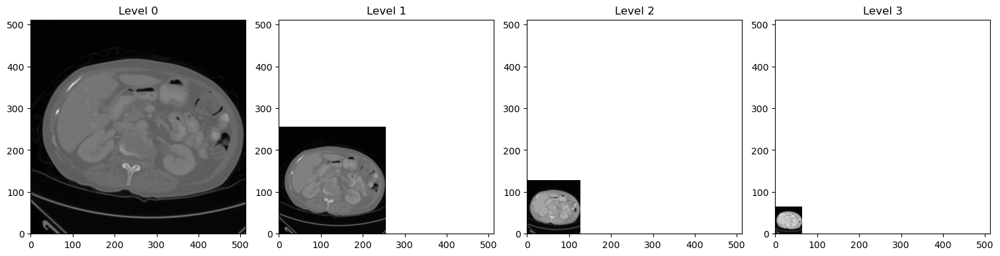

In [46]:
from scipy.ndimage import gaussian_filter

def manual_gaussian_pyramid_builder(image, levels):
    pyramid = [image]
    for i in range(1, levels):
        # Application of a gaussian filter with a fixed sigma 
        blurred_image = gaussian_filter(pyramid[-1], sigma=1)
        # Downsampling H//2 and W//2
        reduced_image = blurred_image[::2, ::2]
        pyramid.append(reduced_image)
    return pyramid

pyramid = manual_gaussian_pyramid_builder(ct_slice, 4)

fig, axes = plt.subplots(1, len(pyramid), figsize=(15, 5), constrained_layout=True)
for i, (ax, level) in enumerate(zip(axes, pyramid)):
    ax.imshow(level, cmap='gray')
    ax.set_title(f'Level {i}')
    ax.set_xlim([0, ct_slice.shape[1]])
    ax.set_ylim([0, ct_slice.shape[0]])

plt.show()

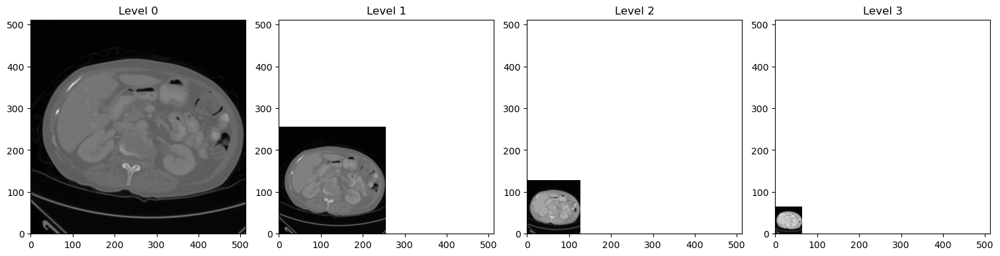

In [47]:
def automatic_gaussian_pyramid_builder(image, levels):
    pyramid = [image]
    for i in range(1, levels):
        reduced_image = cv2.pyrDown(pyramid[-1])
        pyramid.append(reduced_image)
    return pyramid

gaussian_pyramid = automatic_gaussian_pyramid_builder(ct_slice, 4)

fig, axes = plt.subplots(1, len(pyramid), figsize=(15, 5), constrained_layout=True)
for i, (ax, level) in enumerate(zip(axes, pyramid)):
    ax.imshow(level, cmap='gray')
    ax.set_title(f'Level {i}')
    ax.set_xlim([0, ct_slice.shape[1]])
    ax.set_ylim([0, ct_slice.shape[0]])

plt.show()

## Laplacian Pyramid
Laplacian Pyramids are formed from the Gaussian Pyramids and there is no exclusive function for that. 

Laplacian pyramid images are like edge images only. A level in Laplacian Pyramid is formed by the difference between that level in Gaussian Pyramid and expanded version of its upper level in Gaussian Pyramid. 

<center><img src="https://d29g4g2dyqv443.cloudfront.net/sites/default/files/akamai/VRWorks/Training/VRW_generations1.png"/></center>

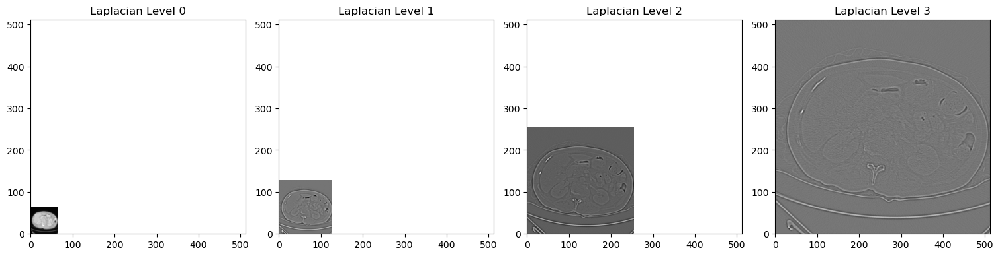

In [48]:
def laplacian_pyramid(gaussian_pyr):
    laplacian_pyr = []
    for i in range(len(gaussian_pyr) - 1):
        # Upsample the next level using the pyrUp method
        upsampled = cv2.pyrUp(gaussian_pyr[i + 1], dstsize=(gaussian_pyr[i].shape[1], gaussian_pyr[i].shape[0]))
        # Subtract the upsampled image from the current level
        laplacian = cv2.subtract(gaussian_pyr[i], upsampled)
        laplacian_pyr.append(laplacian)
    laplacian_pyr.append(gaussian_pyr[-1]) 
    return laplacian_pyr

laplacian_pyr = laplacian_pyramid(gaussian_pyramid)

fig, axes = plt.subplots(1, len(laplacian_pyr), figsize=(15, 5), constrained_layout=True)
for i, (ax, level) in enumerate(zip(axes, laplacian_pyr[::-1])):
    ax.imshow(level, cmap='gray')
    ax.set_title(f'Laplacian Level {i}')
    ax.set_xlim([0, ct_slice.shape[1]])
    ax.set_ylim([0, ct_slice.shape[0]])

plt.show()

# Filtering

### FFT - Fast Fourier Transform

It is a computationally efficient version of the Fourier Transform (FT), which converts a signal ***from the time domain*** (amplitude of the signal as a function of time) ***to the frequency domain*** (intensity of each frequency component present in the signal ).

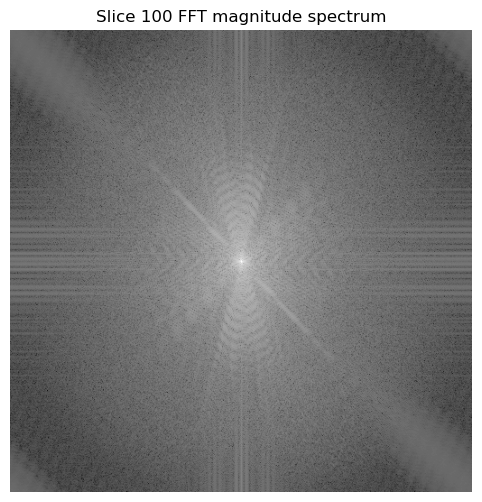

In [49]:
fft_image = np.fft.fft2(ct_slice)

# shift the low frequency components to the center of the transformed image to make the frequency spectrum easier to interpret, 
# since the lowest frequencies will be in the center and the highest frequencies towards the edges.
fft_shifted_image = np.fft.fftshift(fft_image)

magnitude_spectrum = np.log(np.abs(fft_shifted_image))

plt.figure(figsize=(8, 6))
plt.imshow(magnitude_spectrum, cmap='gray')
plt.title(f'Slice {slice_number} FFT magnitude spectrum')
plt.axis('off')
plt.show()

### Low pass filter
Let's create an ideal low pass filter and filter the shifted image

0.0 1.0


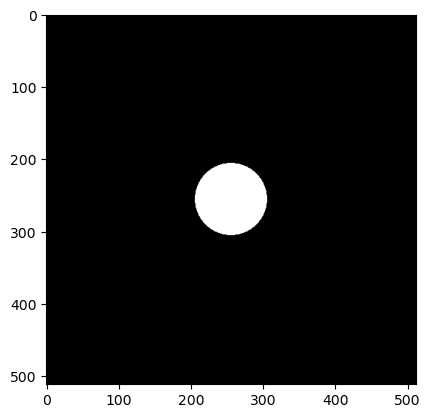

In [50]:
def ideal2d_low_pass(shape, f, pxd=1):
    """Designs an ideal filter with cutoff frequency f. pxd defines the number
       of pixels per unit of frequency (e.g., degrees of visual angle)."""
    pxd = float(pxd)
    rows, cols = shape
    x = np.linspace(-0.5, 0.5, cols)  * cols / pxd
    y = np.linspace(-0.5, 0.5, rows)  * rows / pxd
    radius = np.sqrt((x**2)[np.newaxis] + (y**2)[:, np.newaxis])
    filt = np.ones(shape)
    filt[radius>f] = 0
    return filt

cutoff_frequency = 50
low_filter = ideal2d_low_pass(ct_slice.shape, cutoff_frequency)
print(low_filter.min(),low_filter.max())
plt.imshow(low_filter, cmap="gray")

Now we can compute the response

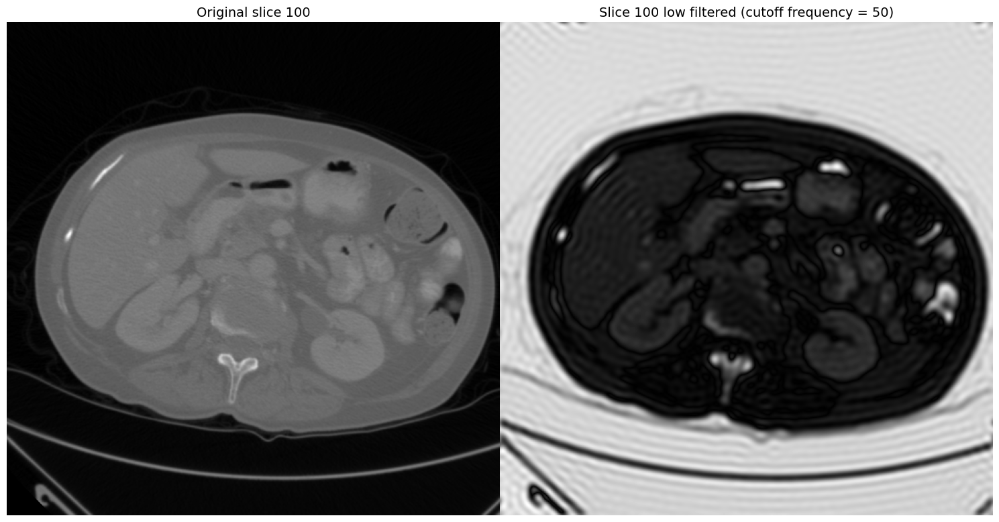

In [51]:
response_fft = fft_shifted_image * low_filter
new_filtered_slice = np.abs(np.fft.ifft2(np.fft.ifftshift(response_fft)))

f, axarr = plt.subplots(1, 2, figsize=(15,15))

img = axarr[0].imshow(np.squeeze(ct_array[slice_number, :, :]), cmap='gray',origin='lower')
axarr[0].axis('off')
axarr[0].set_title(f'Original slice {slice_number}',fontsize=14)

img = axarr[1].imshow(np.squeeze(new_filtered_slice), cmap='gray', origin='lower')
axarr[1].axis('off')
axarr[1].set_title(f'Slice {slice_number} low filtered (cutoff frequency = {cutoff_frequency})',fontsize=14)

plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)

# Exercises 📚

**Exercise 1** - Create a function that uses SimpleITK to
- read a volume 
- print the volume information if needed
- save a new volume if needed

and return the numpy version of the volume.

In [ ]:
def get_volume(volume_path, print_info=True, save_volume=True, name_to_save = "generic_volume", save_extension="nrrd"):
    raise NotImplementedError()

# apply and show the result

**Exercise 2** - Create a function that creates and returns a DRR for axial, coronal and sagittal views

In [ ]:
def get_drr(volume_path, view_axis = {"axial":0,"coronal":1,"sagittal":2}) -> dict:
    raise NotImplementedError()

# apply and show the result

**Exercise 3** - Create a function that creates a minimum intensity projection 

In [ ]:
def min_intensity_projection(volume, views = {0:"axial", 1:"coronal", 2:"sagittal"}) -> dict:
    raise NotImplementedError()

# apply and show the result

**Question 1** - Why is it important to bring CT values ​​between 0 and a positive value (i.e. [0, 1]) before applying histogram stretching?

**Answer:** ...

**Exercise 4** - Create a function to apply convolution without using libraries that automatically apply the kernel and use it to filter an image

In [ ]:
def conv_2d(img, kernel):
    raise NotImplementedError()

# apply and show the result

**Exercise 5** - Create a function that implements Laplacian pyramids without using cv2's pyrUp method 

In [ ]:
def manual_laplacian_pyramid_builder(gaussian_pyr):
    raise NotImplementedError()

# apply and show the result

**Exercise 6** - Use the `conv_2d` function to apply DoG

# References
[fitushar - Medical Imaging Preprocessing](https://github.com/fitushar/3D-Medical-Imaging-Preprocessing-All-you-need/blob/master/Code/3DMedical-Imaging-Preprocessing-All-you-need.ipynb)

[Stretching description](https://www.olympus-lifescience.com/en/microscope-resource/primer/java/digitalimaging/processing/histogramstretching/#:~:text=Histogram%20stretching%20involves%20modifying%20the,image%2C%20this%20process%20is%20straightforward.)

[2D Convolution](https://www.geeksforgeeks.org/apply-a-2d-convolution-operation-in-pytorch/)

[Image Pyramids](https://docs.opencv.org/3.4/d4/d1f/tutorial_pyramids.html)

[Image filters](https://bioimagebook.github.io/chapters/2-processing/4-filters/filters.html#fig-processing-filters-gradient)